In [1]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
def Predict(model, img):
    sr = model(tf.cast(tf.expand_dims(img, axis=0), tf.float32))
    sr = tf.clip_by_value(sr, 0, 255)
    sr = tf.round(sr)
    sr = tf.squeeze(tf.cast(sr, tf.uint8),axis=0)
    return sr

def load_img(path):
    img = np.array(Image.open(path))
    return img

In [3]:
srgan = tf.keras.models.load_model("srgan/model.h5",compile=False)
edsr = tf.keras.models.load_model("edsr/model.h5",compile=False)

/opt/conda/lib/python3.7/site-packages/keras/layers/core/lambda_layer.py:325: UserWarning: models.utils is not loaded, but a Lambda layer uses it. It may cause errors.
  config, custom_objects, "function", "module", "function_type"


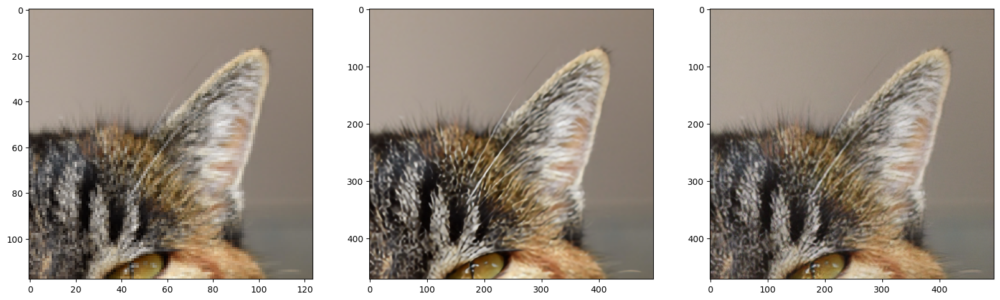

In [4]:
img = load_img("0869x4-crop (1).png")
srgan_pred = Predict(srgan, img)
edsr_pred = Predict(edsr, img)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 20))
axes[0].imshow(img)
axes[1].imshow(edsr_pred)
axes[2].imshow(srgan_pred)
plt.show()

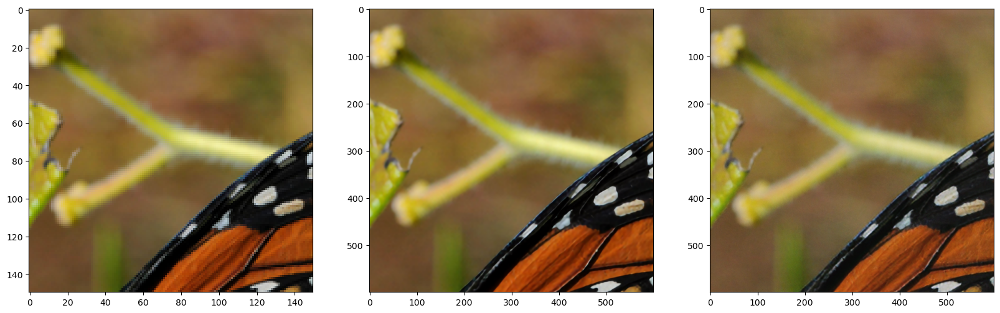

In [5]:
img = load_img("0006x4.png")
img = tf.image.random_crop(img, (150,150,3))
srgan_pred = Predict(srgan, img)
edsr_pred = Predict(edsr, img)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 20))
axes[0].imshow(img)
axes[1].imshow(edsr_pred)
axes[2].imshow(srgan_pred)
plt.show()

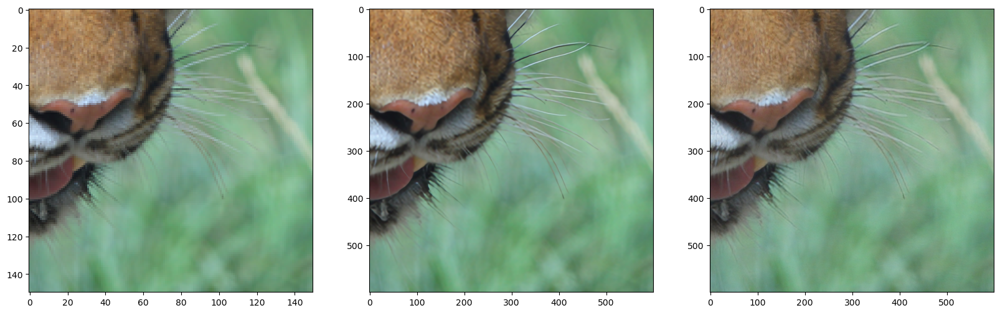

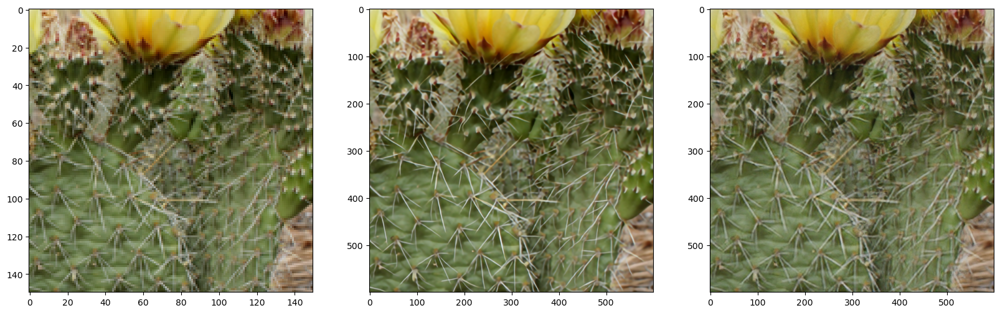

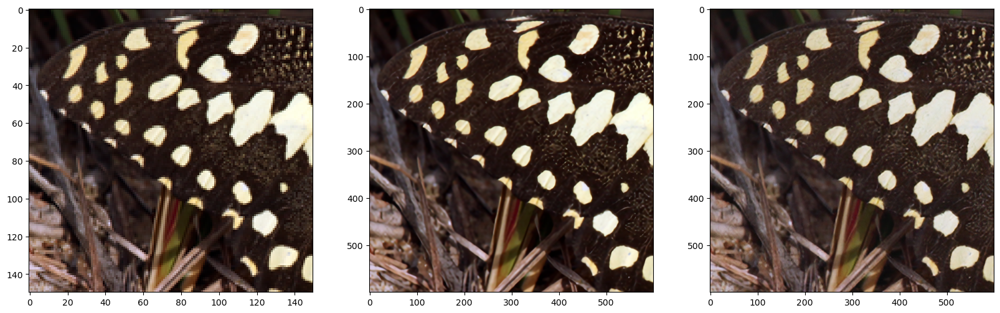

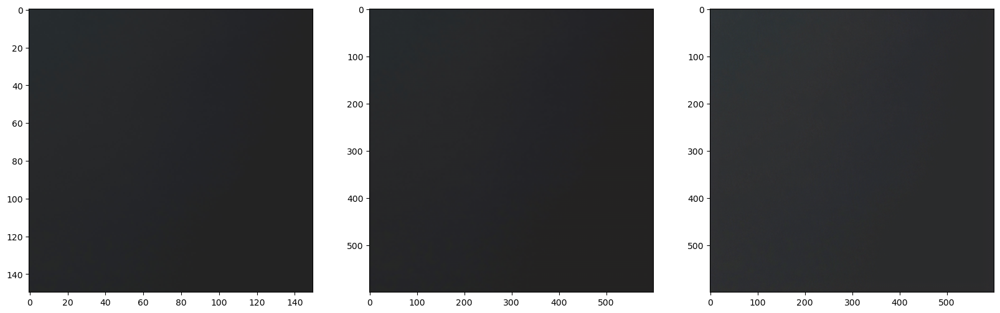

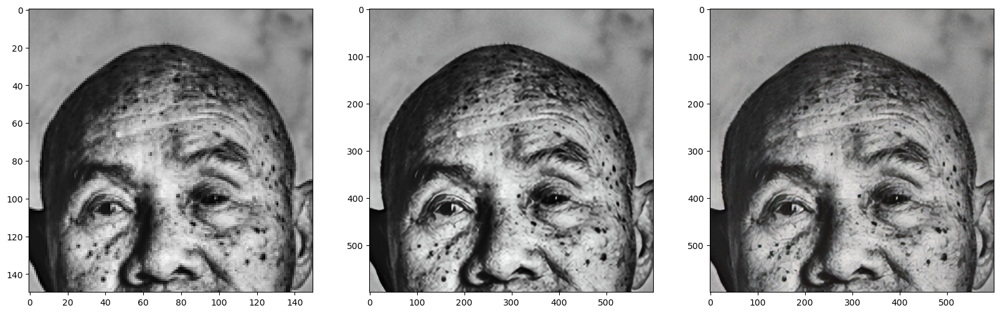

...

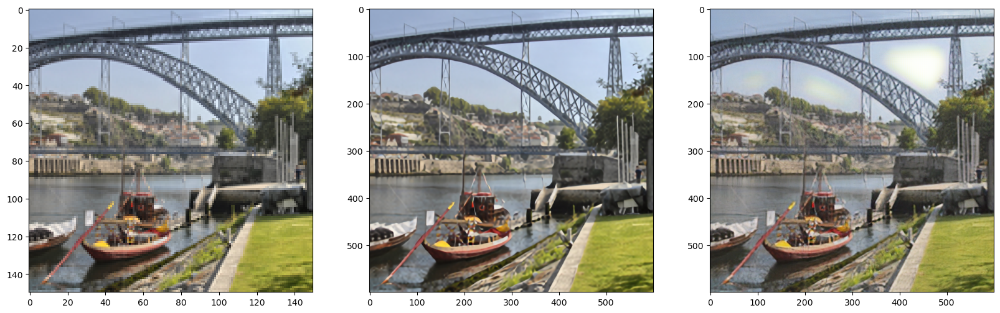

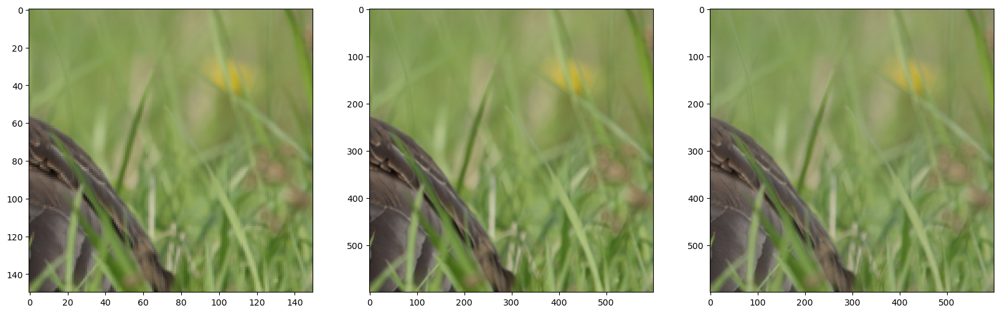

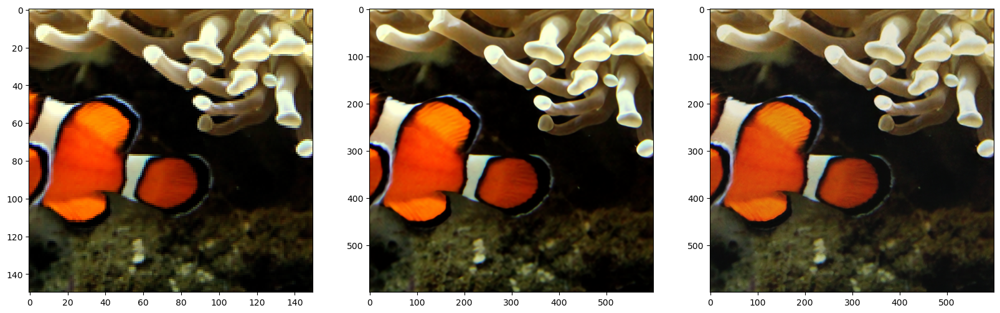

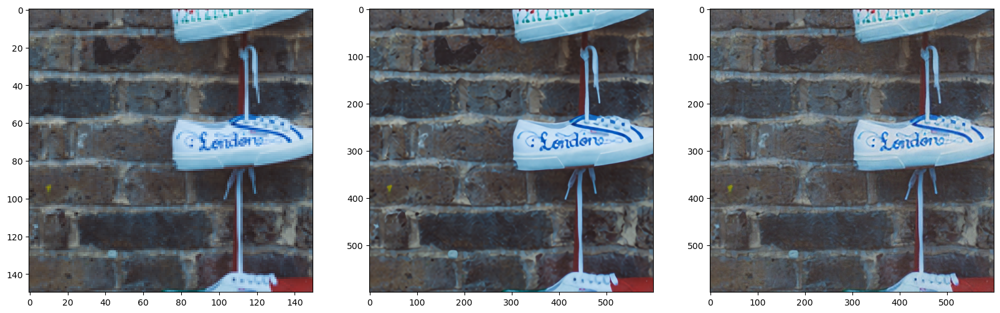

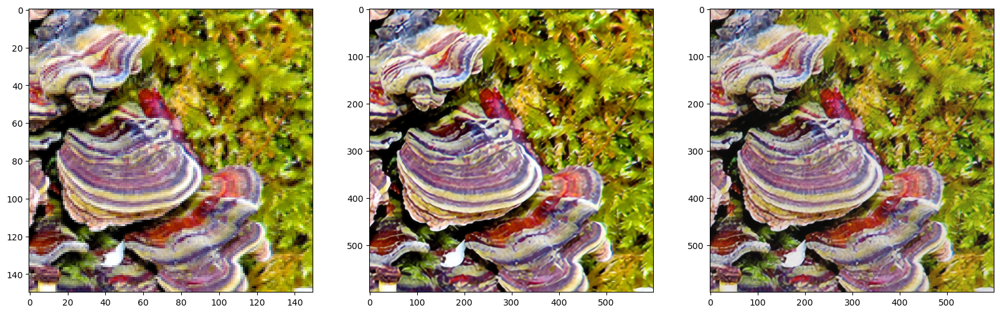

In [6]:
for i in range(10, 27):
    img = load_img(f"00{i}x4.png")
    img = tf.image.random_crop(img, (150,150,3))
    srgan_pred = Predict(srgan, img)
    edsr_pred = Predict(edsr, img)

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 20))
    axes[0].imshow(img)
    axes[1].imshow(edsr_pred)
    axes[2].imshow(srgan_pred)
    plt.show()